# Importing necessary libraries

In [1]:
import os
import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn import preprocessing
import skimage.metrics as metrics
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


%matplotlib inline
# Retina Display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
# Supressing all the warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Watermark code to print library versions
def print_versions():
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
    print(f"numpy version: {np.__version__}")
    print(f"pandas version: {pd.__version__}")
    print(f"matplotlib version: {matplotlib.__version__}")
    print(f"seaborn version: {sns.__version__}")

print_versions()

torch version: 2.4.0
torchvision version: 0.19.0
numpy version: 1.26.4
pandas version: 2.2.2
matplotlib version: 3.7.5
seaborn version: 0.12.2


### Task4_Q_2:

### Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.[3 Marks]

# Setting up the image ready to reconstruct

In [4]:
if os.path.exists('fashion.jpg'):
    print('fashion.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/shutterstock_466589609.jpg -O fashion.jpg

fashion.jpg exists


In [5]:
# Read in a image from torchvision
img = torchvision.io.read_image("fashion.jpg")
print(img.shape)

torch.Size([3, 2005, 2769])


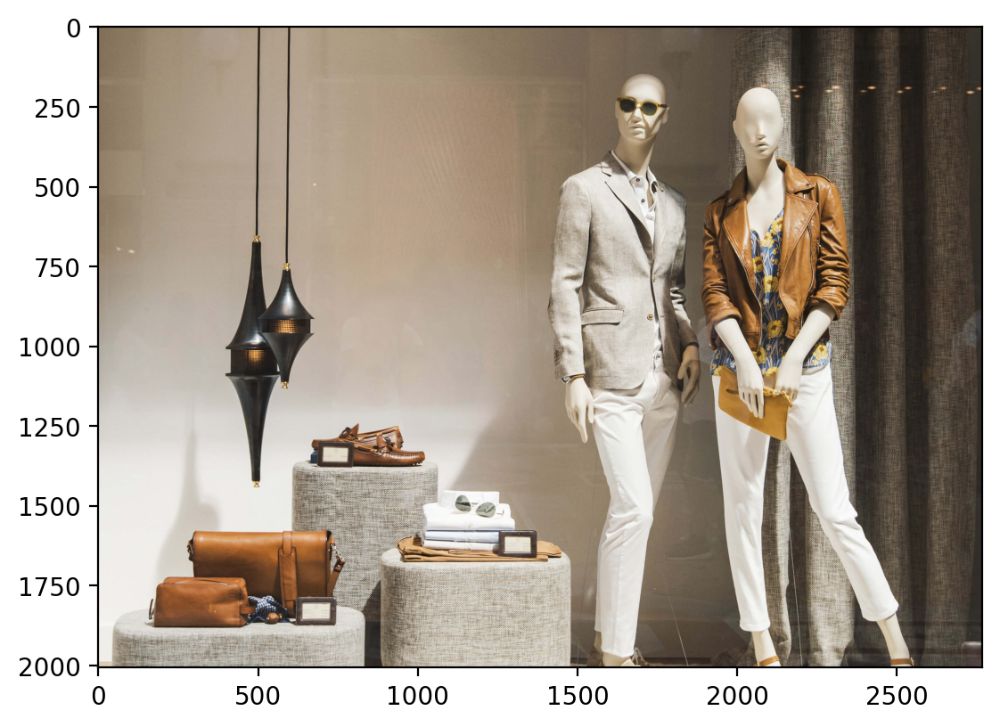

In [6]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [7]:
#Scaling the image tensor
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [8]:
#Apply the fitted scaler to the reshaped image data and reshape back to original dimensions.
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape) 
print(img_scaled.shape)

img_scaled = torch.tensor(img_scaled)

(3, 2005, 2769)


In [9]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.5020, 0.5059, 0.5098,  ..., 0.2235, 0.2235, 0.2353],
         [0.5020, 0.5020, 0.5059,  ..., 0.2235, 0.2235, 0.2353],
         [0.4941, 0.4980, 0.5020,  ..., 0.2235, 0.2235, 0.2353],
         ...,
         [0.8588, 0.8588, 0.8588,  ..., 0.4118, 0.7137, 0.8471],
         [0.8588, 0.8588, 0.8588,  ..., 0.4392, 0.7725, 0.8784],
         [0.8627, 0.8627, 0.8627,  ..., 0.4353, 0.7804, 0.8784]],

        [[0.4314, 0.4353, 0.4392,  ..., 0.2078, 0.2078, 0.2000],
         [0.4314, 0.4314, 0.4353,  ..., 0.2078, 0.2078, 0.2000],
         [0.4235, 0.4275, 0.4314,  ..., 0.2078, 0.2078, 0.2000],
         ...,
         [0.7922, 0.7922, 0.7922,  ..., 0.3804, 0.6863, 0.8392],
         [0.7922, 0.7922, 0.7922,  ..., 0.4078, 0.7451, 0.8667],
         [0.7961, 0.7961, 0.7961,  ..., 0.4039, 0.7529, 0.8667]],

        [[0.3529, 0.3569, 0.3608,  ..., 0.1725, 0.1725, 0.1725],
         [0.3529, 0.3529, 0.3569,  ..., 0.1725, 0.1725, 0.1725],
         [0.3451, 0.3490, 0.3529,  ..., 0.1725, 0.1725, 0.

In [10]:
#cropping the image
crop = torchvision.transforms.functional.crop(img_scaled, 200, 1500, 300, 300)
crop.shape

torch.Size([3, 300, 300])

In [11]:
crop = crop.to(device)

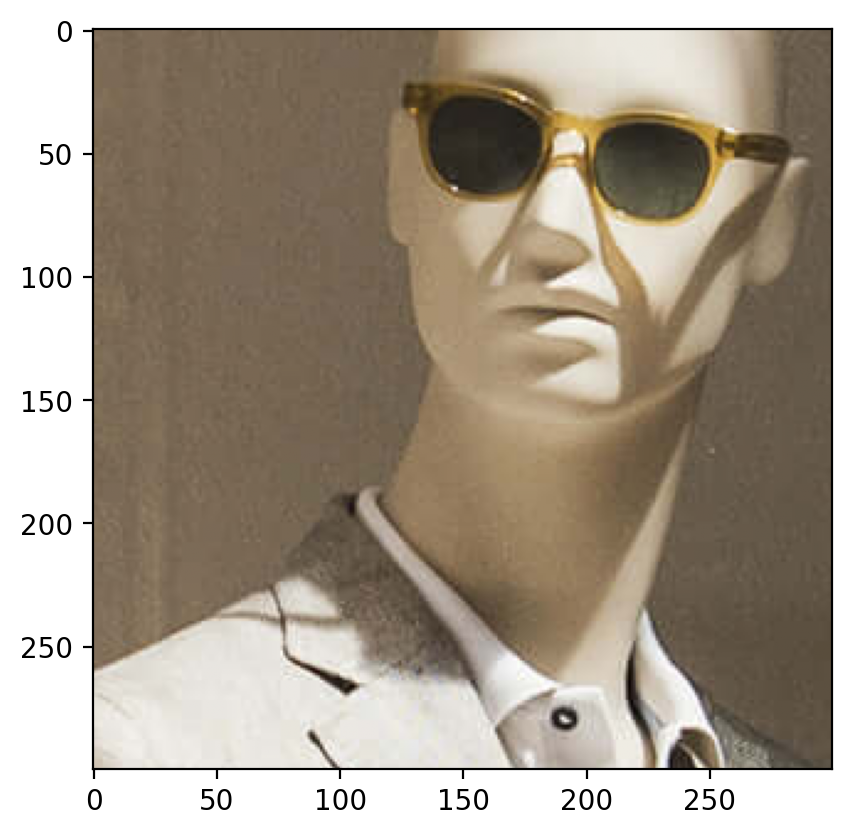

In [12]:
# Move the crop tensor to CPU before plotting
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [13]:
def random_remove(image, block_size=30, seed=None):
    if seed is not None:
        torch.manual_seed(seed)
    
    channels, n, m = image.shape
    start_row = torch.randint(0, n - block_size + 1, (1,)).item()
    start_col = torch.randint(0, m - block_size + 1, (1,)).item()
    
    mask = torch.ones((channels, n, m), dtype=torch.bool)
    mask[:, start_row:start_row + block_size, start_col:start_col + block_size] = False
    
    image_missing = image.clone()
    image_missing[~mask] = float('nan')  # Setting missing pixels to NaN
    
    return image_missing, mask


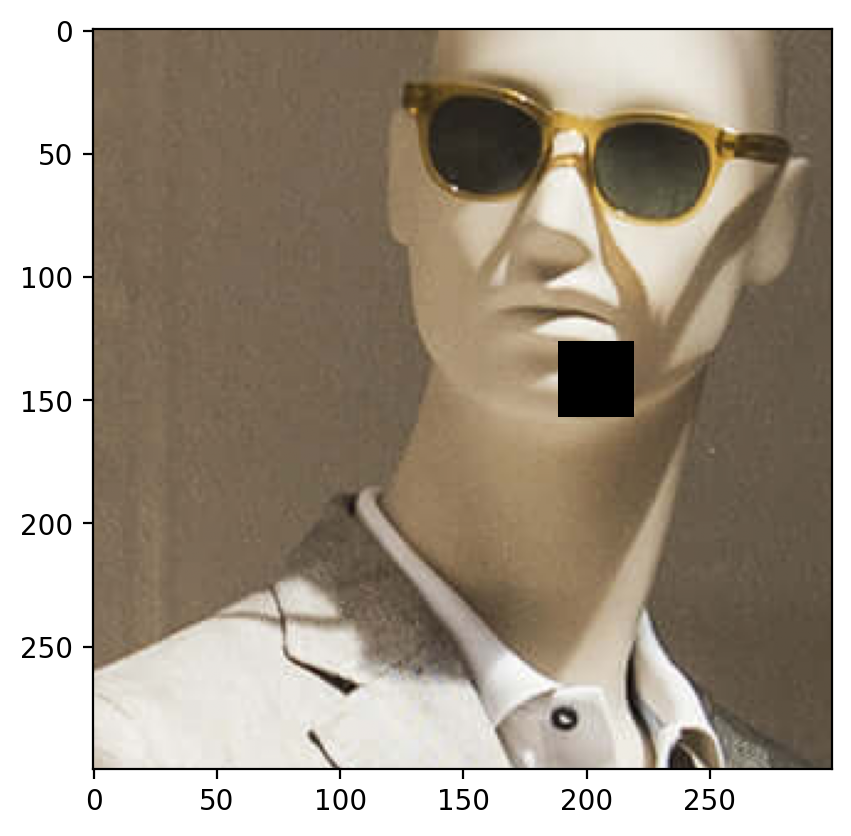

In [14]:
img_with_nan = random_remove(crop, block_size=30, seed=38)
plt.imshow(rearrange(img_with_nan[0], 'c h w -> h w c').cpu().numpy())

# Applying Matrix Factorization to reconstruct

In [15]:
# Apply factorize on all the three channels one by one 

def factorize(A, r, device=torch.device("cpu"), seed=None):
    """Factorize the matrix A into W and H"""
    if seed is not None:
        torch.manual_seed(seed)
        if device.type == 'cuda':
            torch.cuda.manual_seed(seed)
            torch.cuda.manual_seed_all(seed)
    # Randomly initialize W and H
    W = torch.randn(A.shape[0], r, requires_grad=True, device=device)
    H = torch.randn(r, A.shape[1], requires_grad=True, device=device)
    
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    
    #Ignore nan values
    mask = ~torch.isnan(A)
    
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()
        
    return W, H, loss

def factorization_to_channels(tensor, r, device=torch.device("cpu"), seed = None): 
    if seed is not None:
        torch.manual_seed(seed)
        if device.type == 'cuda':
            torch.cuda.manual_seed(seed)
            torch.cuda.manual_seed_all(seed)
            
    new_tensor = torch.zeros_like(tensor).to(device)
    # sigmoid = nn.Sigmoid()

    for channel in range(tensor.shape[0]):
        A = tensor[channel]  # Get the 2D matrix for the current channel
        W, H, loss = factorize(A, r, device=device, seed = seed)  # Factorize the 2D matrix
        new_tensor[channel] = torch.mm(W, H)
        # print(f"Loss of channel {channel}: ", loss.item())

    # min_val = new_tensor.min()
    # max_val = new_tensor.max()
    return new_tensor
    

## Checking the metrics for different values of "r"

In [16]:
import torch

def calculate_rmse_psnr(original_img, reconstructed_img):
    """
    Calculate RMSE and PSNR between original_img and reconstructed_img.

    - original_img (torch.Tensor): The original image tensor (height x width x channels).
    - reconstructed_img (torch.Tensor): The reconstructed image tensor (height x width x channels).

    """

    # Calculate RMSE using PyTorch operations
    mse = torch.mean((original_img - reconstructed_img) ** 2)
    rmse = torch.sqrt(mse).item()  # Convert tensor to a Python float

    # Calculate PSNR
    max_pixel_value = torch.max(original_img).item()  # Get the max pixel value
    psnr = 20 * torch.log10(torch.tensor(max_pixel_value) / rmse) if rmse != 0 else float('inf')

    return rmse, psnr.item()

In [17]:
def plot_reconstructed_and_original_image(original_img, reconstructed_img, title=""):
    """
    original_img (torch.Tensor or np.ndarray): The original image a tensor of shape (H, W).
    reconstructed_img (torch.Tensor or np.ndarray): The reconstructed image
    """
    
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(rearrange(reconstructed_img, 'c h w -> h w c').detach().cpu().numpy())
    ax0.set_title("Reconstructed Image")
    

    ax1.imshow(rearrange(original_img, 'c h w -> h w c').detach().cpu().numpy())
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

In [18]:
def plot_images_and_metrics(img_with_nan,crop):
    r_values = []
    rmse_values = []
    psnr_values = []

    for r in [20, 50, 100, 150, 180, 200, 220, 250]:
        reconstructed_image_1 = factorization_to_channels(img_with_nan[0], r, device=device, seed = 69)
        plot_reconstructed_and_original_image(crop,reconstructed_image_1,title=f"Using Matrix Factorization (r={r})")
        rmse, psnr = calculate_rmse_psnr(crop, reconstructed_image_1)

        r_values.append(r)
        rmse_values.append(rmse)
        psnr_values.append(psnr)
        
    #Visualizing variation of metrics as r increases
    data = pd.DataFrame({
        'Rank': r_values,
        'RMSE': rmse_values,
        'PSNR': psnr_values
    })

    # Plot RMSE vs Rank
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    sns.lineplot(data=data, x='Rank', y='RMSE', marker='o')
    plt.title('RMSE vs Rank')
    plt.xlabel('Rank (r)')
    plt.ylabel('RMSE')

    # Plot PSNR vs Rank
    plt.subplot(1, 2, 2)
    sns.lineplot(data=data, x='Rank', y='PSNR', marker='o')
    plt.title('PSNR vs Rank')
    plt.xlabel('Rank (r)')
    plt.ylabel('PSNR (dB)')

    plt.tight_layout()
    plt.show()
    
    return rmse_values, psnr_values

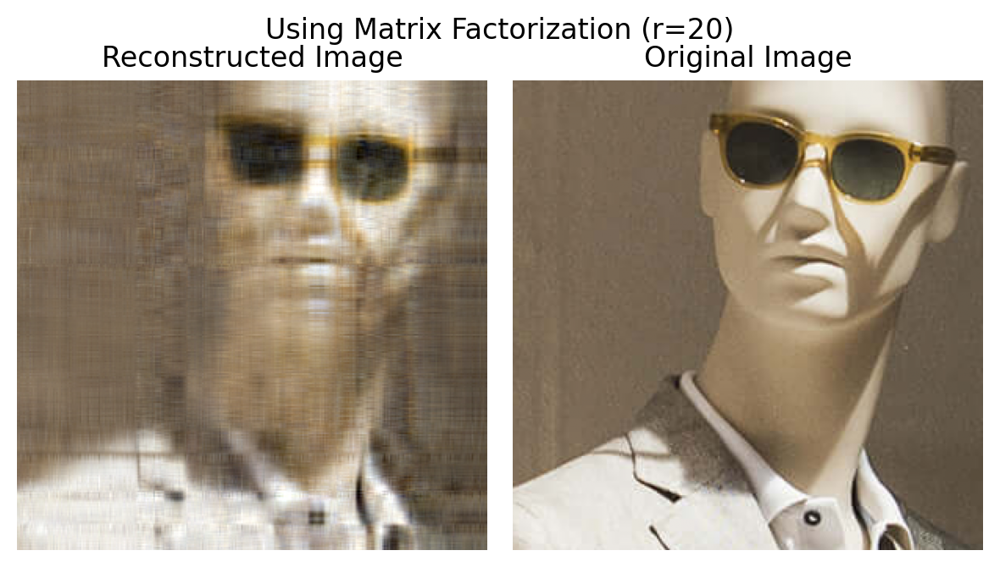

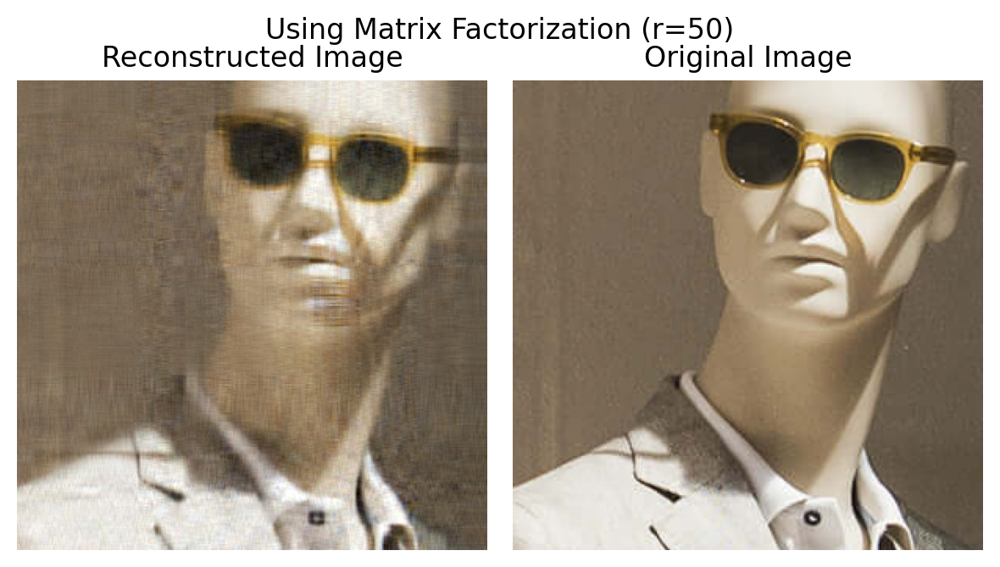

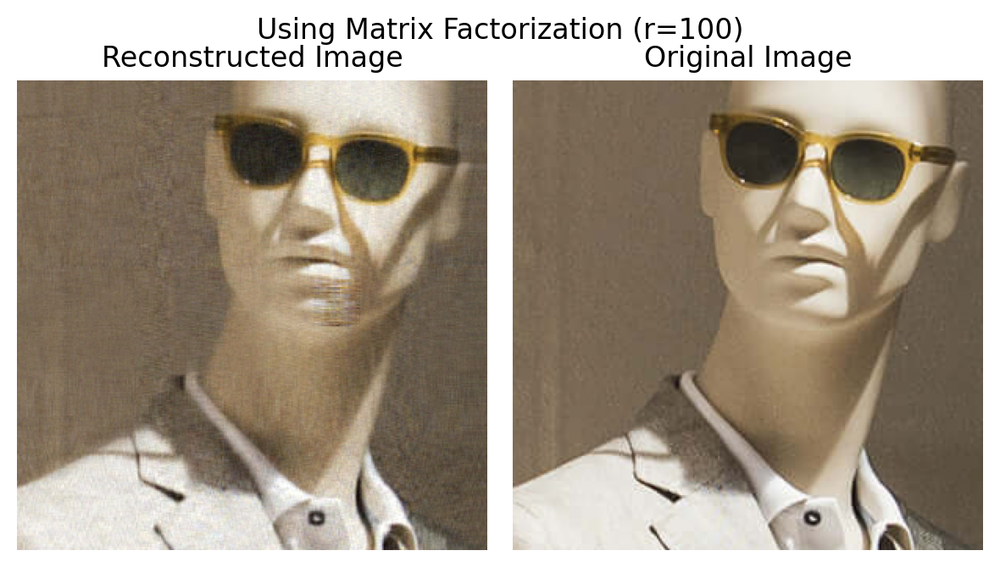

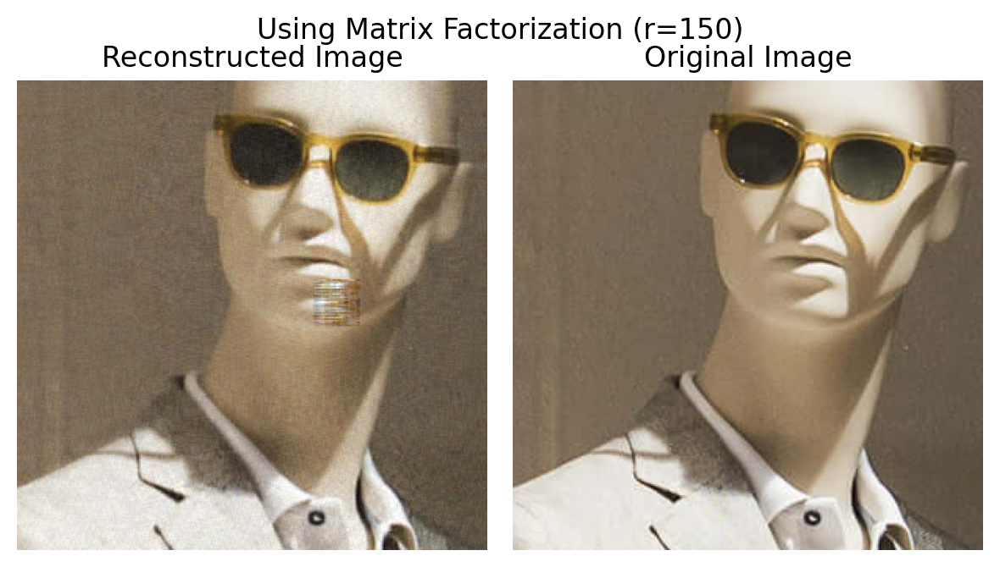

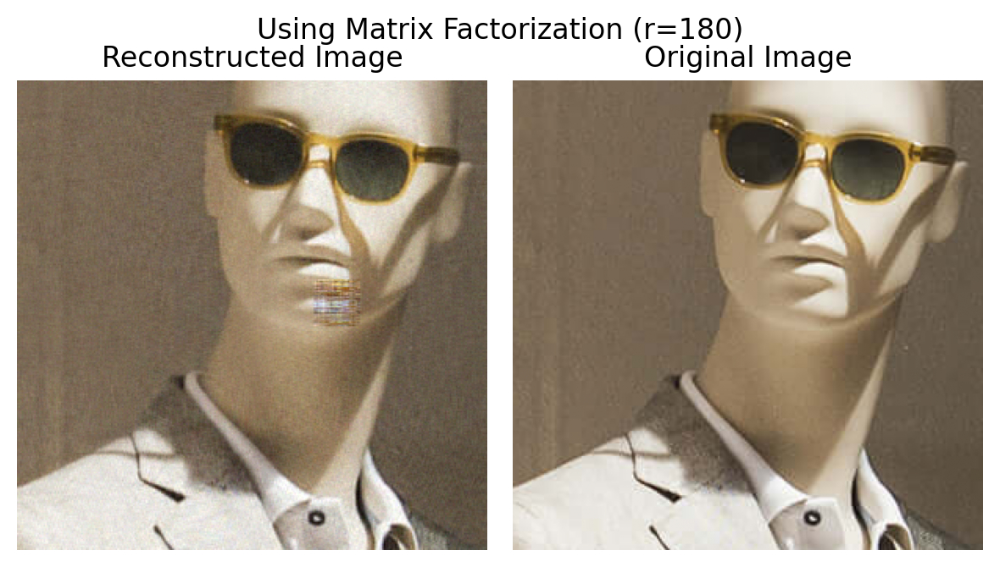

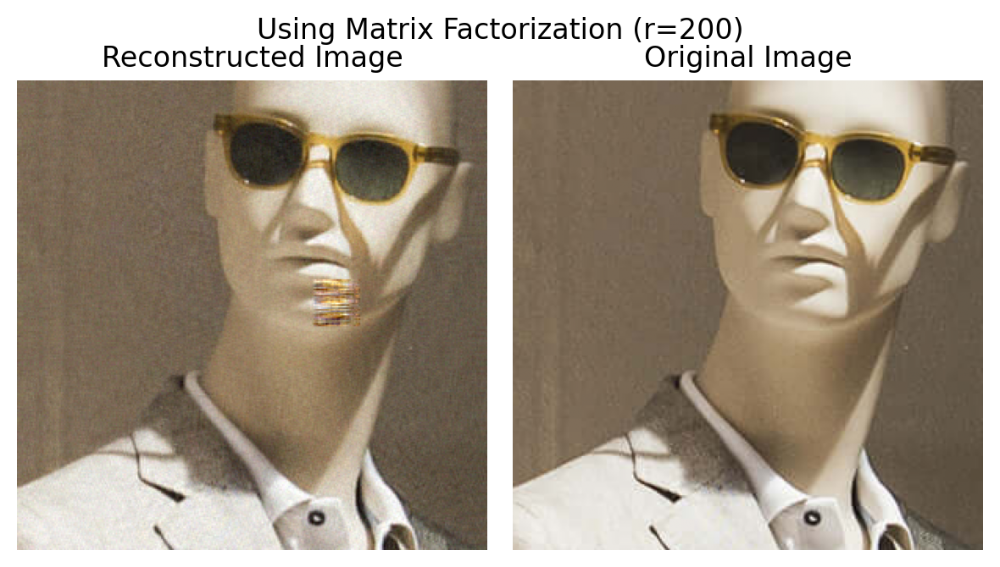

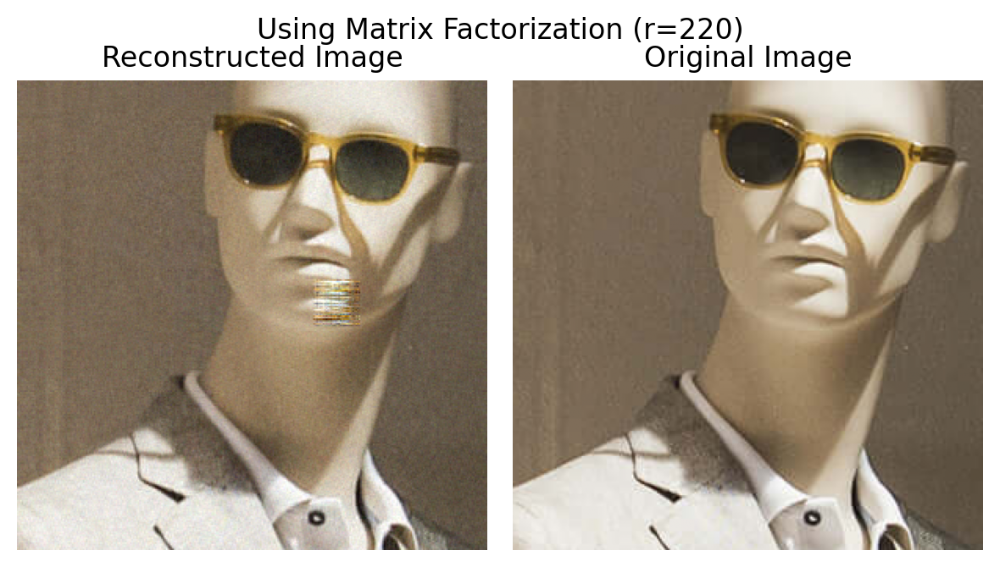

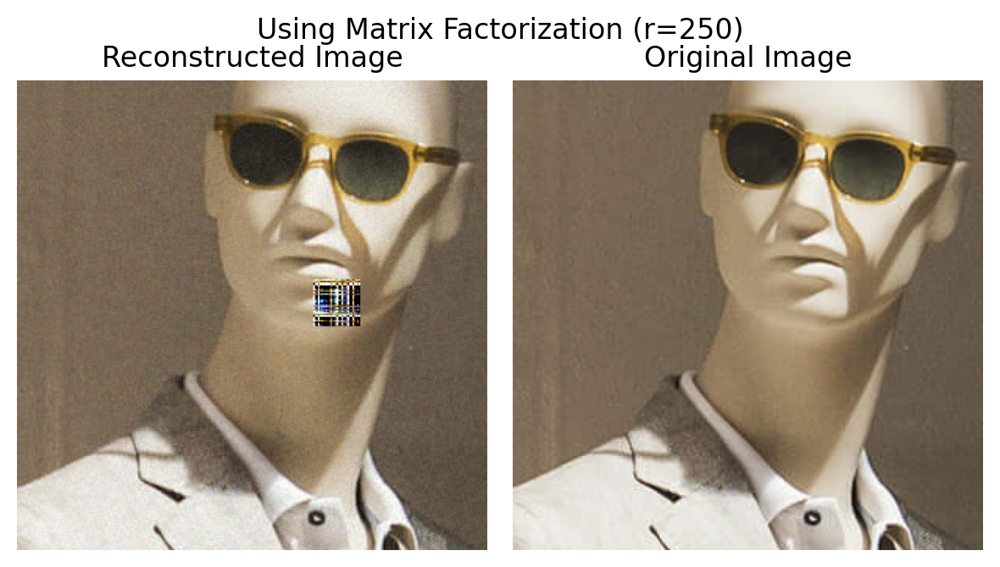

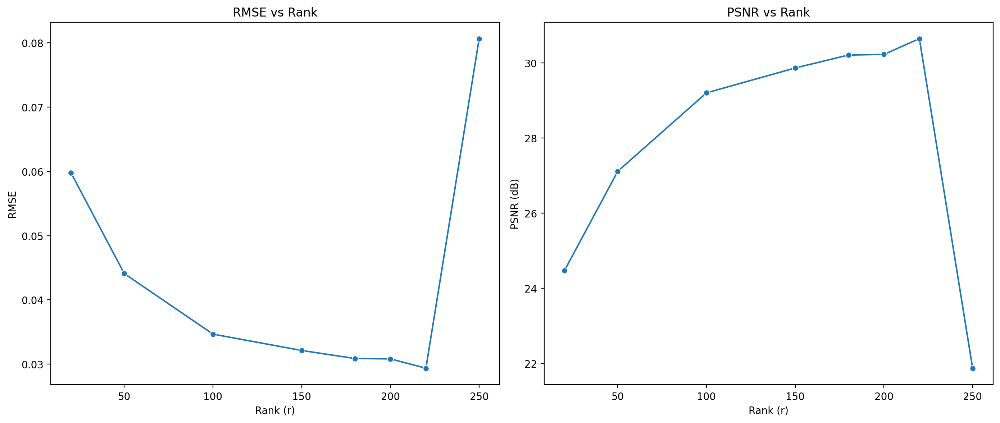

In [19]:
rmse_values, psnr_values = plot_images_and_metrics(img_with_nan,crop)

## Choosing the suitable value for "r"

From the above plots, r=180 seems to be a suitable choice as we have minimum loss and maximum PSNR value for it. After it, the the change in metrics is not significant.

In [20]:
best_rmse = min(rmse_values)
best_psnr = max(psnr_values)
print(f"RMSE: {best_rmse:.4f}")
print(f"PSNR: {best_psnr:.2f} dB")

RMSE: 0.0294
PSNR: 30.65 dB


# Using RFF features to reconstruct

In [21]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [22]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)
    
    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    
    return X, Y

In [23]:
fashion_X, fashion_Y = create_coordinate_map(img_with_nan[0])

fashion_X.shape, fashion_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [24]:
# MinMaxScaler from -1 to 1 to stabilize training of the neural network
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(fashion_X.cpu())

# Scale the X coordinates
fashion_X_scaled = scaler_X.transform(fashion_X.cpu())

# Move the scaled X coordinates to the GPU
fashion_X_scaled = torch.tensor(fashion_X_scaled).to(device)

# Set to dtype float32
fashion_X_scaled = fashion_X_scaled.float()

In [25]:
# create RFF features
def create_rff_features(X, num_features, sigma, random_seed=None):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2), random_state=random_seed)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [26]:
X_rff = create_rff_features(fashion_X_scaled, 37500, 0.065, random_seed = 42)
X_rff.shape

torch.Size([90000, 37500])

In [27]:
# Create a mask for valid (non-NaN) pixels in fashion_Y
mask = ~torch.isnan(fashion_Y)

In [28]:
#Lineaer Regression using neural networks

class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        # Define a linear transformation layer
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        # Apply the linear transformation
        return self.linear(x)

In [29]:
#Define model
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=37500, out_features=3, bias=True)
)

In [30]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    Train the neural network with a set seed for reproducibility.

    net: torch.nn.Module - The model to train
    lr: float - Learning rate for the optimizer
    X: torch.Tensor of shape (num_samples, 2) - Input features
    Y: torch.Tensor of shape (num_samples, 3) - Target outputs
    """

    criterion = nn.MSELoss()  # Loss function
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)  # Optimizer

    for epoch in range(epochs):
        optimizer.zero_grad()  # Clears old gradients
        
        # Forward pass
        outputs = net(X)  # Predictions

        # Applying the mask to filter out NaN values
        masked_outputs = outputs[mask]  
        masked_Y = Y[mask]  

        # Computing the loss only on the valid pixels
        loss = criterion(masked_outputs, masked_Y)

        # Backward pass
        loss.backward()
        optimizer.step()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item(), outputs  # Return final loss and reconstructed image


In [31]:
# Ensure X_rff and fashion_Y are both of dtype float32
X_rff = X_rff.float()
fashion_Y = fashion_Y.float()

#Train the model
loss_rff, reconstructed_image_rff = train(net, 0.005, X_rff, fashion_Y, 2500) #lr=0.005 and epoch=2500

Epoch 0 loss: 0.291401
Epoch 100 loss: 0.003491
Epoch 200 loss: 0.003213
Epoch 300 loss: 0.003135
Epoch 400 loss: 0.003094
Epoch 500 loss: 0.003067
Epoch 600 loss: 0.003047
Epoch 700 loss: 0.003032
Epoch 800 loss: 0.003020
Epoch 900 loss: 0.003010
Epoch 1000 loss: 0.003002
Epoch 1100 loss: 0.002996
Epoch 1200 loss: 0.002990
Epoch 1300 loss: 0.002985
Epoch 1400 loss: 0.002981
Epoch 1500 loss: 0.002977
Epoch 1600 loss: 0.002974
Epoch 1700 loss: 0.002970
Epoch 1800 loss: 0.002968
Epoch 1900 loss: 0.002965
Epoch 2000 loss: 0.002962
Epoch 2100 loss: 0.002959
Epoch 2200 loss: 0.002957
Epoch 2300 loss: 0.002955
Epoch 2400 loss: 0.002953


In [32]:
def plot_reconstructed_and_original_image_for_rff(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval() # Set model to evaluation mode
    with torch.no_grad(): # Disable gradient computation to save memory and computation
        outputs = net(X) # Perform forward pass without tracking gradients and get outputs
        outputs = outputs.reshape(height, width, num_channels)
#         outputs = outputs.permute(2,0,1)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")
    

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

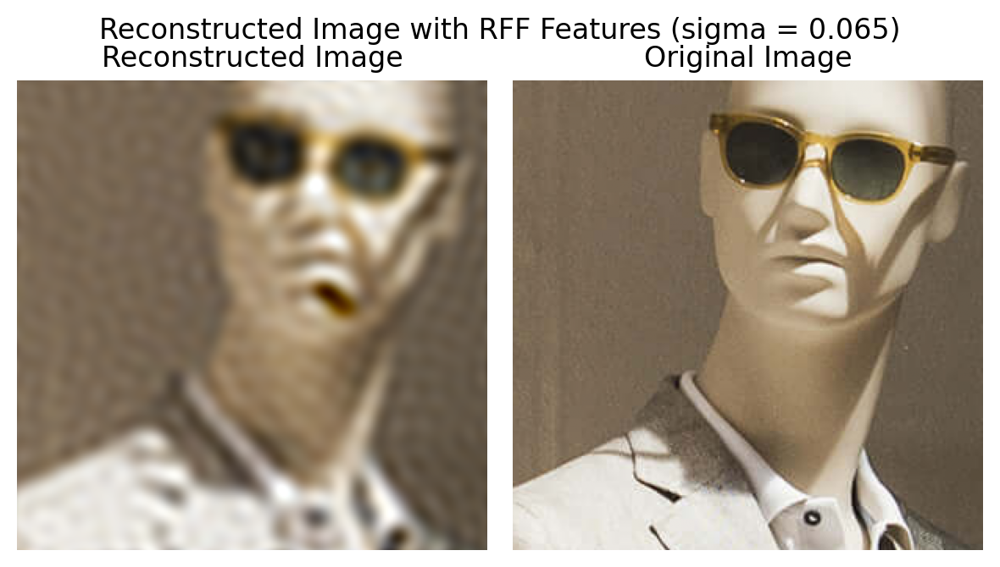

In [33]:
plot_reconstructed_and_original_image_for_rff(crop, net, X_rff, title="Reconstructed Image with RFF Features (sigma = 0.065)")

In [34]:
num_channels, height, width = crop.shape  # Get original image shape
reconstructed_image_rff = reconstructed_image_rff.reshape(height, width, num_channels).permute(2, 0, 1)


In [35]:
rmse_rff, psnr_rff = calculate_rmse_psnr(crop, reconstructed_image_rff)
print(f"RMSE: {rmse_rff:.4f}")
print(f"PSNR: {psnr_rff:.2f} dB")

RMSE: 0.0657
PSNR: 23.65 dB


## Reconstructing the Image for Different Sigmas:

In [38]:
from PIL import Image

image_dir = '/kaggle/working'  


image_files = [
    'sig0p02.png',  
    'sig0p05.png',
    'sig0p06.png',
    'sig0p065.png',  
    'sig0p07.png',
    'sig0p08.png'
]

images = []

for file_name in image_files:
    file_path = os.path.join(image_dir, file_name)
    if os.path.exists(file_path):
        image = Image.open(file_path)
        images.append(image)
    else:
        print(f"File not found: {file_path}")

output_gif_path = os.path.join(image_dir, "vary_sigma.gif")

if images:
    images[0].save(output_gif_path, save_all=True, append_images=images[1:], duration=1000, loop=0)
    print(f"GIF saved at {output_gif_path}")
else:
    print("No images were loaded.")


GIF saved at /kaggle/working/vary_sigma.gif


I experimented with varying values of sigma and analyzed the output both qualitatively and quantitatively. However, due to memory constraints, I was unable to reconstruct all the images in a single session. As a result, I calculated and saved the outputs individually and made a gif. You can find the individual outputs in the assets folder, organized by different sigma values.

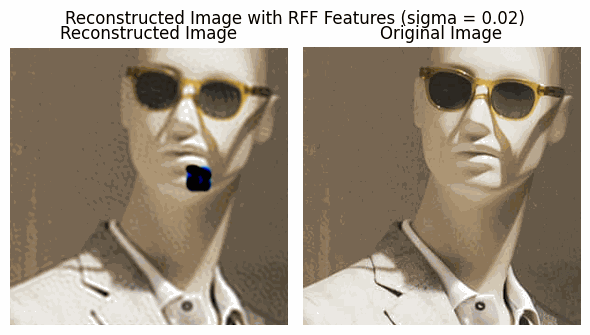

In [40]:
from IPython.display import Image as IPImage, display
display(IPImage(filename="/kaggle/working/vary_sigma.gif"))

- Qualitative Analysis:
As you can see for higher $\sigma$ values, the model is creating less complex decision boundaries and is not able to capture the fine details of the image. On the other hand, for lower $\sigma$ values, the model is creating more complex decision boundaries and is able to capture the fine details of the image but further decreasing the $\sigma$ value will lead to overfitting and the model will not be able to generalize well on the test data. This we can see in the image with $\sigma$ = 0.02, the model has high variance.



In [36]:
sigma_values = [0.02, 0.05, 0.06,0.065, 0.07, 0.08]
rmse_values_rff = [0.1896, 0.0947, 0.0660, 0.0657, 0.0661, 0.0642]
psnr_values_rff = [14.44, 20.47, 23.61, 23.65, 23.60, 23.84]

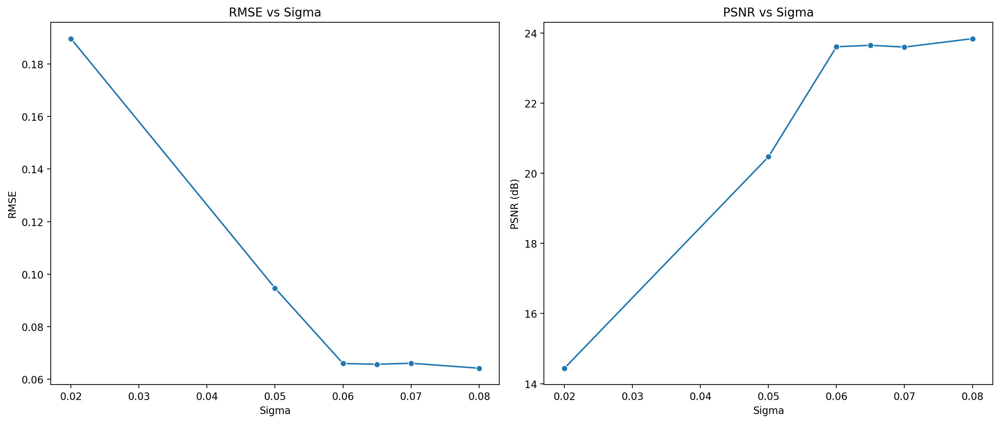

In [37]:
#Visualizing variation of metrics as sigma varies
data = pd.DataFrame({
    'Sigma': sigma_values,
    'RMSE': rmse_values_rff,
    'PSNR': psnr_values_rff
})

# Plot RMSE vs Rank
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.lineplot(data=data, x='Sigma', y='RMSE', marker='o')
plt.title('RMSE vs Sigma')
plt.xlabel('Sigma')
plt.ylabel('RMSE')

# Plot PSNR vs Rank
plt.subplot(1, 2, 2)
sns.lineplot(data=data, x='Sigma', y='PSNR', marker='o')
plt.title('PSNR vs Sigma')
plt.xlabel('Sigma')
plt.ylabel('PSNR (dB)')

plt.tight_layout()
plt.show()

## Choosing the optimal value of $\sigma$

- Quantitative Analysis:
 - PSNR > 40 dB: Excellent quality, almost no noticeable difference between the original and reconstructed image.
 - 30 dB < PSNR < 40 dB: Good quality, with minor, often imperceptible differences.
 - 20 dB < PSNR < 30 dB: Moderate quality, with visible differences that might not be acceptable in high-precision tasks.
 - PSNR < 20 dB: Poor quality, with significant noise or distortion.
 
 
 The best PSNR of 23.84 (at $\sigma$ = 0.08)  suggests we are able to reconstruct the image upto moderate quality but not better than that of using matrix factorization. We have to a **tradeoff between the image quality and the extent of reconstruction**. The "0.065" can be considered as the optimal value for $\sigma$  as it balances the PSNR value while effectively preserving the image quality upto a reasonable extent.

# Observations

1. **The matrix factorization method performed better** (as expected) because it levereges the inherent structure of the image and tends to preserve spatial consistency, which makes it more reliable for reconstructing missing pixels, especially when the number of missing pixels is significant. 
2. RFF is primarily used for approximating kernel methods, and when paired with linear regression, it may not capture the spatial relationships between neighboring pixels as effectively as matrix factorization. It also relies on random sampling, which can introduce more variability in the performance.


3. Reconstructing an image where data is missing from a specific patch, rather than randomly, is challenging because: 
 - The gap disrupts structured features like edges or textures. Unlike random noise, the missing region lacks neighboring pixel guidance, making it hard to ensure smooth transitions and maintain the image’s coherence.
 - The missing patch originally contains multiple shades of gray. Without precise boundaries or gradient information, predicting the subtle shifts in gray levels across the patch adds another layer of complexity.  